# NoteBook Projet Python

##### (Faire confiance au notebook pour l'affichage des maps)

### Packages

Installation des package plotly et folium sur la machine pour en utiliser les modules. 

In [1]:
!pip install plotly
!pip install folium

In [2]:
# storing and anaysis
import numpy as np
import pandas as pd

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
import json

### Import et Nettoyage des données 2021

In [3]:
url = r"https://www.data.gouv.fr/fr/datasets/r/817204ac-2202-4b4a-98e7-4184d154d98c"
vf2021 = pd.read_csv(url, sep="|",header=0, low_memory = False)

Nous nous débarassons des colonnes qui auront peu d'intérêt pour nôtre étude. Nous avons décidé de ne garder que les mutations comportant un lot.

In [4]:
del vf2021["Code service CH"]
del vf2021["Reference document"]
del vf2021["1 Articles CGI"]
del vf2021["2 Articles CGI"]
del vf2021["3 Articles CGI"]
del vf2021["4 Articles CGI"]
del vf2021["5 Articles CGI"]
del vf2021["No disposition"]
del vf2021["No voie"]
del vf2021["B/T/Q"]
del vf2021["Code voie"]
del vf2021["Code postal"]
del vf2021["Code commune"]
del vf2021["Prefixe de section"]
del vf2021["Section"]
del vf2021["No plan"]
del vf2021["Code type local"]
del vf2021["Identifiant local"]
del vf2021["No Volume"]

In [5]:
del vf2021["1er lot"]
del vf2021["2eme lot"]
del vf2021["3eme lot"]
del vf2021["4eme lot"]
del vf2021["5eme lot"]
del vf2021["Surface Carrez du 2eme lot"]
del vf2021["Surface Carrez du 3eme lot"]
del vf2021["Surface Carrez du 4eme lot"]
del vf2021["Surface Carrez du 5eme lot"]
vf2021['Date mutation']= pd.to_datetime(vf2021['Date mutation']) 
vf2021 = vf2021[vf2021["Nombre de lots"]<=1]

Nous enlevons les lignes ne comportant pas de valeur pour la valeur foncière, le code département et la surface carrez du lot conservé.

In [6]:
vf2021.dropna(axis="rows", subset=["Valeur fonciere","Code departement","Surface Carrez du 1er lot"],how='any',inplace = True)

Les colonnes Valeur foncière et Surface carrez du 1er lot étant des float écrits avec une virgule, nous remplaçons cette virgule par un point avant de convertir en float.

In [7]:
fct = lambda x: float(x.replace(",","."))
vf2021["Valeur fonciere"] = vf2021["Valeur fonciere"].apply(fct)

fct2 = lambda x: x.replace(",",".")
vf2021["Surface Carrez du 1er lot"] = vf2021["Surface Carrez du 1er lot"].apply(fct2)
vf2021["Surface Carrez du 1er lot"] = vf2021["Surface Carrez du 1er lot"].apply(float)

Vérification du bon fonctionnement du apply

In [8]:
vf2021["Surface Carrez du 1er lot"]

26          63.57
52          37.56
83          89.62
194         41.47
208        100.82
            ...  
3379197     35.22
3379207    104.54
3379210     29.01
3379212     27.20
3379223     15.67
Name: Surface Carrez du 1er lot, Length: 197051, dtype: float64

Nous ajoutons une colonne Prix au m2 qui équivaut à la valeur foncière divisée par la surface du lot. 

In [9]:
vf2021["Prix au m2"]=vf2021["Valeur fonciere"]/vf2021["Surface Carrez du 1er lot"]

Aperçu de notre table de données après l'ensemble de ces modifications.

In [10]:
vf2021.tail(2)

,Date mutation,Nature mutation,Valeur fonciere,Type de voie,Voie,Commune,Code departement,Surface Carrez du 1er lot,Nombre de lots,Type local,Surface reelle bati,Nombre pieces principales,Nature culture,Nature culture speciale,Surface terrain,Prix au m2
3379212,2021-12-03,Vente,323050.0,RUE,SAINT-DENIS,PARIS 02,75,27.20,1,Appartement,25.0,2.0,NaN,NaN,NaN,11876.838235
3379223,2021-03-17,Vente,190000.0,RUE,D ABOUKIR,PARIS 02,75,15.67,1,Appartement,15.0,1.0,NaN,NaN,NaN,12125.079770


---

### Visualisations et interprétations - 2021

*Les données ayant maintenant été nettoyées, nous pouvons passer à l'interprétation de celles-ci*

Nous regroupons nos valeurs par code département. Cela nous donne un aperçu géographique (sans map pour l'instant) des différentes moyennes de nos variables pour chaque département. Ainsi nous pouvons par exemple observer que le nombre moyen de pièces principales est le plus élevé dans le 77 alors qu'il est le plus faible à paris. La surface carrez moyenne quant à elle est particulièrement élevée dans le dans le 57. 

In [11]:
temp = vf2021.groupby(["Code departement"],as_index=False).mean() 
temp.style.background_gradient(cmap='Reds')

,Code departement,Valeur fonciere,Surface Carrez du 1er lot,Nombre de lots,Surface reelle bati,Nombre pieces principales,Surface terrain,Prix au m2
0,01,214911.975202,71.991045,1.000000,59.445501,2.363570,213.181818,3423.518630
1,02,98021.229041,73.190639,1.000000,52.800459,1.678899,295.000000,2253.141626
2,03,85056.963190,66.707362,1.000000,48.611111,1.888889,397.000000,1519.804329
3,04,93444.899343,53.096811,1.000000,41.775641,1.693910,2272.875000,2018.837278
4,05,117469.452040,44.107187,1.000000,36.043339,1.404494,301.250000,3143.811594
5,06,295858.124142,56.736496,1.000000,45.007952,1.746294,584.225410,6030.639201
6,07,113210.711111,71.586333,1.000000,58.933333,2.144444,202.000000,1945.770326
7,08,103017.738095,68.602429,1.000000,55.430622,1.732057,159.000000,2426.580281
8,09,85379.125000,60.058906,1.000000,49.104712,2.026178,292.583333,1681.029588
9,10,103845.979419,53.773814,1.000000,44.041456,1.771486,247.000000,2911.970569


Pour comprendre les différents types de voies:
https://www.cohesion-territoires.gouv.fr/sites/default/files/2019-05/Comite%20scientfique%20de%20l%27observation%20des%20loyers_Annexe_abreviations_des_noms_de_voie.pdf

Nous regroupons nos valeurs selon le type de voie et nous pouvons en déduire les valeurs extrêmes et les différences. 
Nous voyons ainsi que la valeur foncière est très haute pour les ZI, ce qui correspond aux "zones industrielles". C'est donc logique car ces zones comportent des biens destinés aux professionnels.

In [12]:
temp2 = vf2021[vf2021["Type de voie"]!=np.nan]
temp2 = vf2021.groupby(["Type de voie"]).mean() 
temp2.style.background_gradient(cmap='Greens')

,Valeur fonciere,Surface Carrez du 1er lot,Nombre de lots,Surface reelle bati,Nombre pieces principales,Surface terrain,Prix au m2
Type de voie,,,,,,,
ACH,333359.166667,69.121667,1.000000,51.333333,2.000000,nan,4879.086203
ALL,365167.947355,66.818609,1.000000,54.432020,2.411286,499.322148,6289.005922
ART,136876.971538,44.363846,1.000000,42.538462,1.846154,nan,4012.315430
AV,343112.915957,59.766311,1.000000,48.174683,1.829267,357.282353,7854.235196
BD,312599.220983,58.268624,1.000000,45.150467,1.727165,416.393443,6991.677265
BRTL,346190.714286,46.310000,1.000000,37.857143,1.714286,nan,7184.212960
CAE,112576.666667,40.877222,1.000000,47.111111,1.722222,nan,3016.659691
CAMI,180221.543478,48.182174,1.000000,40.130435,2.108696,236.000000,3690.693199
CAR,275766.666667,58.510667,1.000000,20.466667,1.000000,nan,5750.677196


Valeur moyenne des mutation en centaines de milliers d'euros au cours de l'année 2021.

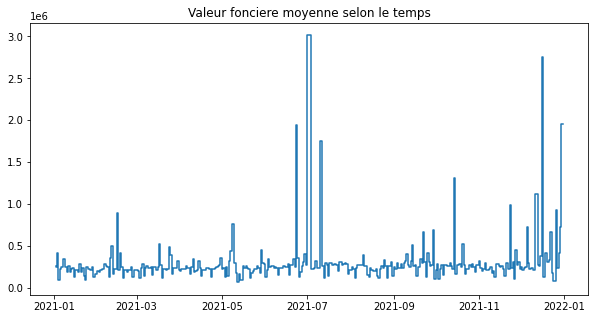

In [13]:
temp3 = vf2021.groupby(by="Date mutation",as_index=False).mean()
vf2021
temp3.sort_values( "Date mutation",inplace=True)
plt.figure(figsize=(10, 5))
plt.title("Valeur fonciere moyenne selon le temps")
plt.step(temp3["Date mutation"],temp3["Valeur fonciere"]);

Valeur foncière en fonction du nombre de pièces principales. Nous remarquons que ces deux variables n'ont pas l'air corrélés.

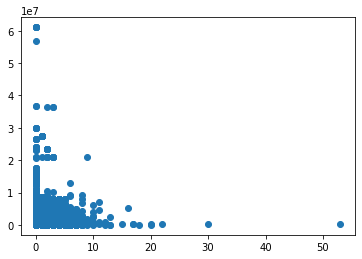

In [14]:
plt.scatter(vf2021["Nombre pieces principales"],vf2021["Valeur fonciere"]);

In [15]:
temp4 = vf2021.groupby(by="Type local",as_index=False).count()

Part des types de local pour l'ensemble des mutations passées au cours de l'année. La très grande majorité concerne donc des appartements.

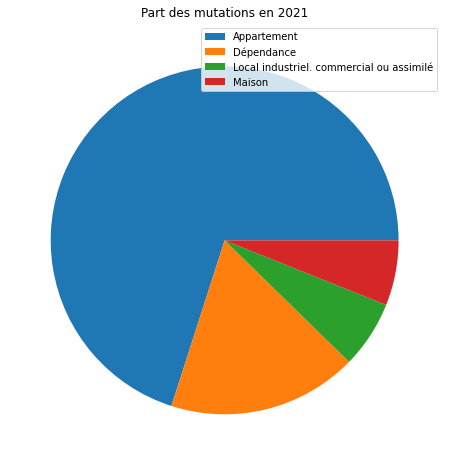

In [16]:
plt.figure(figsize=(14, 8))
plt.pie(temp4["Nature mutation"])
plt.legend(temp4["Type local"])
plt.title('Part des mutations en 2021');

En effet nous obserevons ici que les appartements représentent plus de 120 000 mutations alors que les dépendances concernent environ 30 000 mutations soit 4 fois moins.

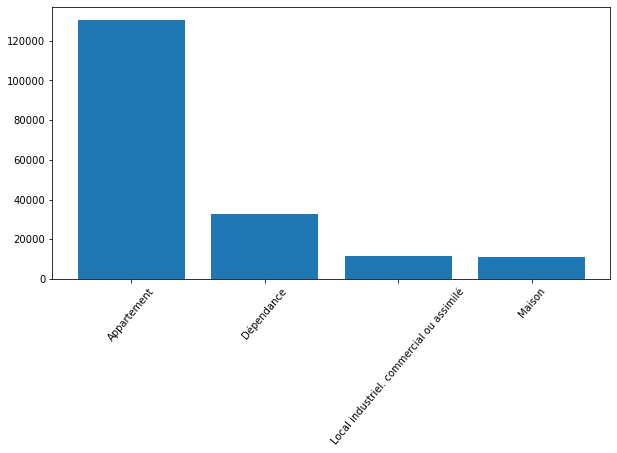

In [17]:
plt.figure(figsize=(10, 5))
plt.bar(temp4["Type local"],temp4["Nature mutation"]);
plt.xticks(rotation=50,ha="center");

Regardons maintenant le nombre de pièces principales dans l'ensemble des mutations. Nous voyons que la plupart des mutations comportent 0,2 ou 3 pièces, cela représente ~69% des mutations.

In [18]:
temp5=vf2021.dropna(axis="rows", subset=["Nombre pieces principales"],how='any')
temp5=temp5.groupby(by="Nombre pieces principales",as_index=False).count()

In [19]:
fig=px.pie(temp5, values="Commune", names="Nombre pieces principales");
fig.show("notebook");

Créons maintenant quelques maps de paris et de ses différents arrondissements. Pour ce faire, nous avons besoin des données géographiques locales dans un format geojson. Nous avons donc trouvé un fichier fourni par la ville de Paris où les données correspondantes ressemblent à celles de notre dataframe, mais nécessitent tout de même une modification de notre dataframe. En effet il nous faut obtenir l'arrondissement à partir de la commune, sans 0 lorsqu'il est inférieur à 10 (ex: 06 -> nous voulons 6). Pour cela nous prenons les deux dernières valeurs de la commune (Paris XX) et nous appliquons un strip sur le 0 à gauche s'il est présent.

In [20]:
paris = vf2021[vf2021["Code departement"]=="75"]
paris = paris.groupby(by="Commune",as_index=False).mean()
paris["Commune"]=paris["Commune"].apply(lambda x: int(x[-2:].lstrip("0")))
paris.head(1)

,Commune,Valeur fonciere,Surface Carrez du 1er lot,Nombre de lots,Surface reelle bati,Nombre pieces principales,Surface terrain,Prix au m2
0,1,1.060614e+06,50.3429,1.0,44.025,1.28,NaN,18111.025801


Importons donc nos arrondissements dans python.

In [21]:
#arrondissements = json.load(open("arrondissements.geojson"))
arrondissements =r"https://opendata.paris.fr/explore/dataset/arrondissements/download/?format=geojson&timezone=Europe/Berlin&lang=fr"

Nous obtenons ainsi nos arrondissements que nous allons lier à "feature.properties.c_ar" dans notre arrondissements.geojson.
Nous choisissons une localisation centrée sur paris et assez zoomée.
La map suivante nous donne la valeur foncière moyenne par arrondissement. Nous observons que le 6ème le 7ème et le 8ème ont des valeurs foncières moyennes très hautes, suivis par le 16ème arrondissement. 

In [22]:
#state_geo = "https://france-geojson.gregoiredavid.fr/repo/departements/75-paris/communes-75-paris.geojson" #ne convient pas pour nous
m = folium.Map(location=[48.86248747835313, 2.3383857736195335], zoom_start=12)

folium.Choropleth(
    geo_data=arrondissements,
    key_on = "feature.properties.c_ar",
    data=paris,
    columns=["Commune", "Valeur fonciere"], #clef pour lier puis valeur à afficher
    fill_color = "RdPu"
).add_to(m)

folium.LayerControl().add_to(m)

m

Observons maintenant la surface carrez. On observe que le 16ème arrondissement arrive en tête avec presque 70m2 en moyenne.

In [23]:
m = folium.Map(location=[48.86248747835313, 2.3383857736195335], zoom_start=12)

folium.Choropleth(
    geo_data=arrondissements,
    key_on = "feature.properties.c_ar",
    data=paris,
    columns=["Commune", "Surface Carrez du 1er lot"],
    fill_color = "RdPu"
).add_to(m)

folium.LayerControl().add_to(m)

m

Enfin, observons le nombre moyen de pièces principales selon les différents arrondissements. Surprenamment, cette carte semble être l'inverse de la carte précédente. On en déduit que les plus grandes surfaces ne sont pas composées de plus de pièces mais au contraire de moins de pièces plus grandes. C'est le cas pour les locaux industriels/commerciaux.

In [24]:
#state_geo = "https://france-geojson.gregoiredavid.fr/repo/departements/75-paris/communes-75-paris.geojson"
m = folium.Map(location=[48.86248747835313, 2.3383857736195335], zoom_start=12)

folium.Choropleth(
    geo_data=arrondissements,
    key_on = "feature.properties.c_ar",
    data=paris,
    columns=["Commune", "Nombre pieces principales"],
    fill_color = "RdPu"
).add_to(m)

folium.LayerControl().add_to(m)

m

Réalisons maintenant une étude sur l'ensemble du pays en se délimitant selon les départements.

In [25]:
france = vf2021.groupby(by="Code departement",as_index=False).mean()
france.head(5)

,Code departement,Valeur fonciere,Surface Carrez du 1er lot,Nombre de lots,Surface reelle bati,Nombre pieces principales,Surface terrain,Prix au m2
0,01,214911.975202,71.991045,1.0,59.445501,2.363570,213.181818,3423.518630
1,02,98021.229041,73.190639,1.0,52.800459,1.678899,295.000000,2253.141626
2,03,85056.963190,66.707362,1.0,48.611111,1.888889,397.000000,1519.804329
3,04,93444.899343,53.096811,1.0,41.775641,1.693910,2272.875000,2018.837278
4,05,117469.452040,44.107187,1.0,36.043339,1.404494,301.250000,3143.811594


Cette fois nous importons les données directement par le site france geojson qui nous fournit les données geojson nécessaires à la reproduction de la map avec les départements français (hors outre mer).
De cette première map nous observons que la moyenne des surfaces est plus importante dans les terres que sur les côtes. Dans deux département elle est particulièrement élevée, principalement à cause des locaux industriels/commerciaux dont les surfaces sont très grandes.
Nous pouvons apercevoir la "diagonale du vide", qui, comportant de grands terrains non occupés, permet de plus grandes surfaces.

In [26]:
france_json = "https://france-geojson.gregoiredavid.fr/repo/departements.geojson"
m = folium.Map(location=[46, 2.3383857736195335], zoom_start=5)

folium.Choropleth(
    geo_data=france_json,
    key_on = "feature.properties.code",
    data=france,
    columns=["Code departement", "Surface Carrez du 1er lot"],
    fill_color = "BuPu"
).add_to(m)

folium.LayerControl().add_to(m)

m

Cette fois-ci nous affichons le nombre moyen de pièces principales et comme pour Paris, nous observons que les départements avec le plus grand nombre moyen de pièces sont ceux qui ont les moins grandes surfaces totales en moyenne. On en tire la même conclusion que pour Paris : une plus grande surface n'implique pas un plus grand nombre de pièce, ce qui est particulièrement influencé par les locaux de professionnels.

In [27]:
france_json = "https://france-geojson.gregoiredavid.fr/repo/departements.geojson"
m = folium.Map(location=[46, 2.3383857736195335], zoom_start=5)

folium.Choropleth(
    geo_data=france_json,
    key_on = "feature.properties.code",
    data=france,
    columns=["Code departement", "Nombre pieces principales"],
    fill_color = "BuPu"
).add_to(m)

folium.LayerControl().add_to(m)

m

Si nous affichons maintenant la carte des surfaces réelles baties moyennes, on voit assez clairement que dans les terres et dans les départements comportant surtout des quartiers pavillonnaires, ces surfaces sont importantes tandis que dans les département moins dynamique ou plus peuplés (donc avec plus d'immeubles) elles sont plus faibles

In [28]:
france_json = "https://france-geojson.gregoiredavid.fr/repo/departements.geojson"
m = folium.Map(location=[46, 2.3383857736195335], zoom_start=5)

folium.Choropleth(
    geo_data=france_json,
    key_on = "feature.properties.code",
    data=france,
    columns=["Code departement", "Surface reelle bati"],
    fill_color = "BuPu"
).add_to(m)

folium.LayerControl().add_to(m)

m

Ici nous observons la valeur foncière et le prix au m2. Nous remarquons que les deux semblent assez corrélés. Ainsi des biens plus chers ont tendance à avoir un prix au m2 plus important. De plus nous pouvons voir que la plupart des prix au m2 se situent autour de 3000 euros tandis que la majorité des valeurs foncières se situent autour de 100 000 euros.

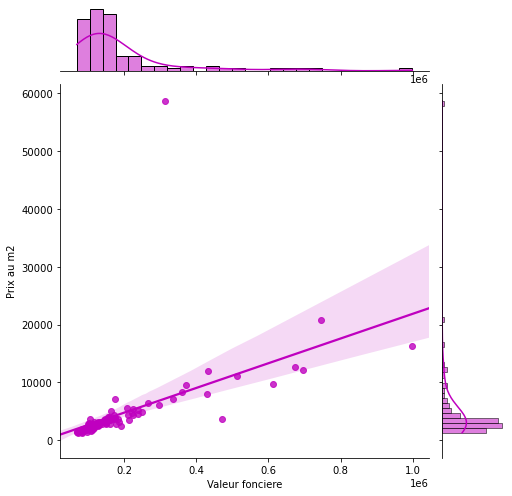

In [29]:
temp6 = vf2021.groupby(by="Code departement",as_index=False).mean()
sns.jointplot(x="Valeur fonciere", y="Prix au m2", data=temp6,
                  kind="reg", truncate=False,
                  #xlim=(0, 60), ylim=(0, 12),
                  color="m", height=7);

Grâce à la fonction sns.pairplot, nous pouvons représenter des plots de toutes nos colonnes en fonction de toutes les autres.
C'est ce que nous faisons ici en donnant à chaque point une couleur selon son département. Nous pouvons ainsi conjecturer sur les corrélations entre les variables. On peut par exemple voir que le nombre de pièces principales a l'air très lié à la surface réelle batie. On peut aussi voir que le prix au m2 ne semble pas avoir une grande influence sur les variations de : la surface réelle batie, le nombre de pièces principales ou encore la surface du terrain.

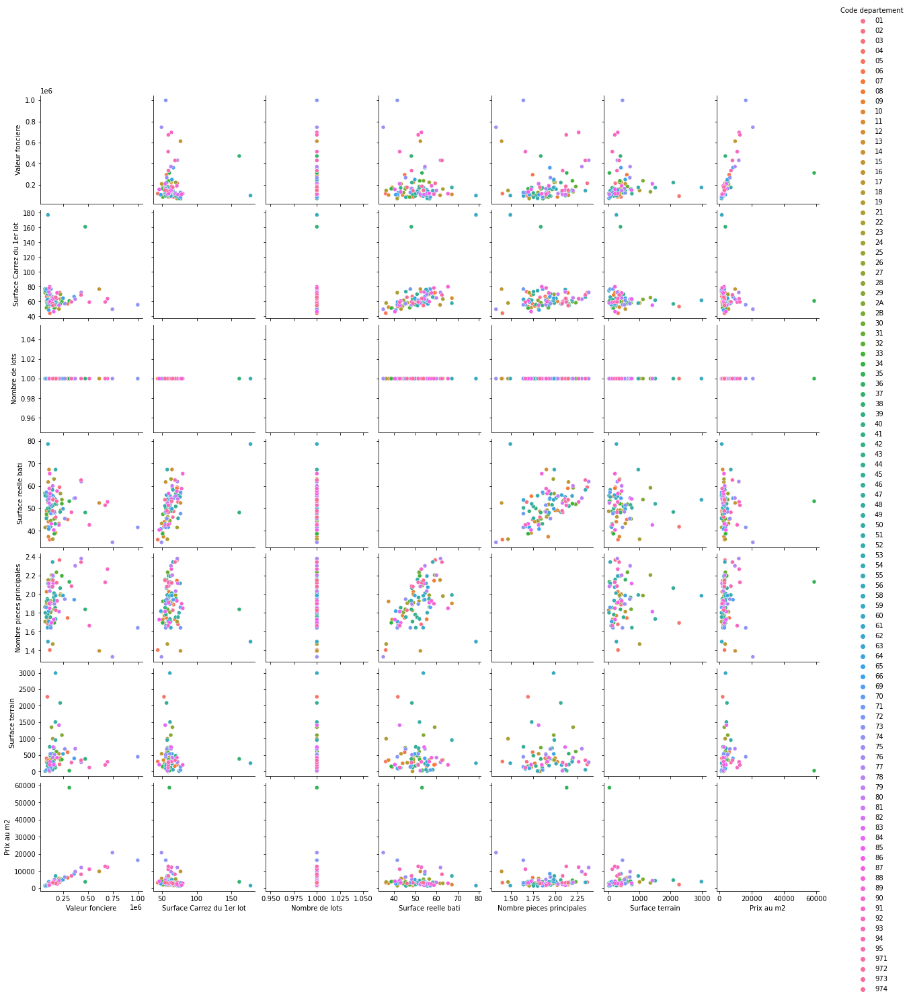

In [30]:
temp6 = vf2021.groupby(by="Code departement",as_index=False).mean()
sns.pairplot(temp6, hue="Code departement");

Ici, nous avons représenté les valeurs foncières des mutations au cours de l'année. Plus la surface est grande plus le point représentant la mutation est de grand diamètre. La couleur de ces points dépend de la nature de la mutation. Nous voyons que les ventes comptent pour la majorité des mutations avec des surfaces très variables. Les surfaces les plus grandes sont celles coutant le plus cher (la plupart des plus gros points sont plus hauts que le reste). 

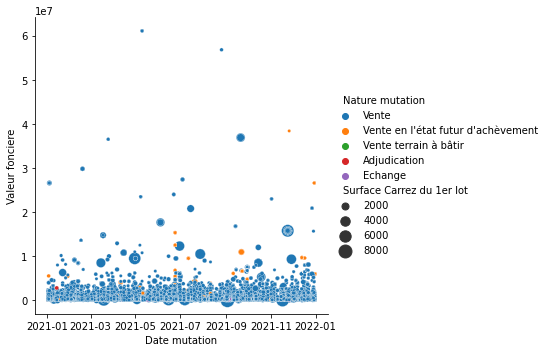

In [31]:
g = sns.relplot(
    data=vf2021,
    x="Date mutation", y="Valeur fonciere",
    hue="Nature mutation", size="Surface Carrez du 1er lot",
    sizes=(10, 200)
);

Si nous étudions la distribution des valeurs foncières en fonction de la nature de la mutation, nous concluons que les échanges ont tendance à impliquer les valeurs foncières les moins élevées contrairement aux ventes en l'état futur d'achèvement.

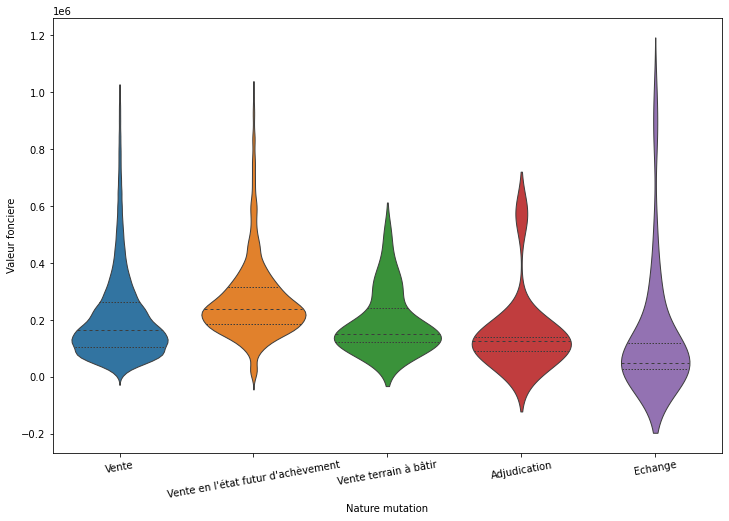

In [32]:
plt.figure(figsize=(12, 8))
plt.xticks(rotation=10)
sns.violinplot(data=vf2021[vf2021["Valeur fonciere"]<1000000], x="Nature mutation", y="Valeur fonciere", 
               split=True, inner="quart", linewidth=1);

Cette fois étudions la distribution de la valeur foncière selon le type de local. Sans grande surprise, la distribution est plus haute pour les maisons que pour les appartements, impliquant des biens plus chers. Pus surprenant cepedant, la distribution des valeurs foncières pour les locaux est importante autour de 100 000 euros, bien que la distribution soit plus importante que pour les 3 autres types de locaux pour les valeurs foncières élevées.

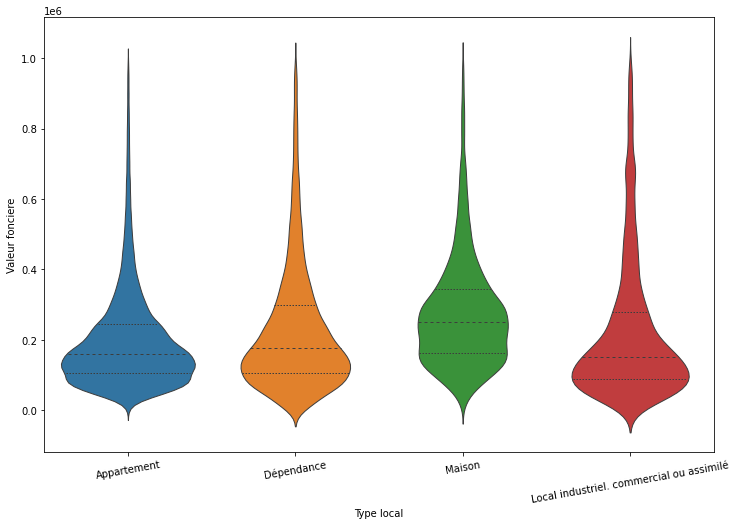

In [33]:
plt.figure(figsize=(12, 8))
plt.xticks(rotation=10)
sns.violinplot(data=vf2021[vf2021["Valeur fonciere"]<1000000], x="Type local", y="Valeur fonciere", 
               split=True, inner="quart", linewidth=1);

Ici nous avons une heatmap des moyennes des surfaces carrez, surfaces reelles baties et nombres de pièces principales selon le mois de la date de mutation. Ces valeurs sont relativement uniformes avec cependant un pic pour la surface carrez au moins d'octobre.

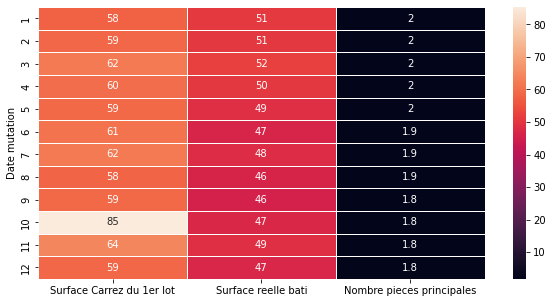

In [34]:
temp7 = vf2021
temp7 = temp7.groupby(temp7["Date mutation"].dt.month).mean()
del temp7["Valeur fonciere"]
del temp7["Prix au m2"]
del temp7["Surface terrain"]
del temp7["Nombre de lots"]
plt.figure(figsize=(10, 5))
sns.heatmap(temp7, annot=True, linewidths=.5);

Avec un graph nous observons bien ce pic alors que le reste des valeurs stagne varie que très légèrement avec des tendances de baisse. 

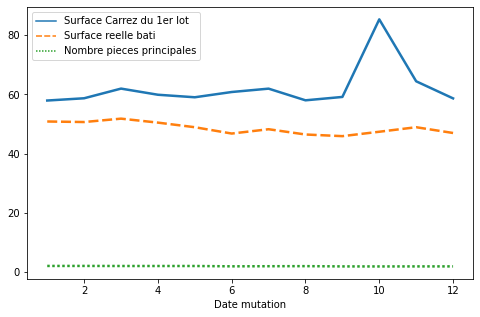

In [35]:
plt.figure(figsize=(8, 5))
sns.lineplot(data=temp7, palette="tab10", linewidth=2.5);

Si nous regardons la valeur foncière totale générée par les différentes mutations, nous voyons très clairement que les ventes sont les plus importantes, représentant presque à elles seules la totalité des valeurs foncières impliquées. Les ventes de terrain à batir, les échanges et les adjudication sont négligeables devant les ventes en l'état futur d'achèvement et les ventes.

In [36]:
fig = px.treemap(vf2021, path=["Nature mutation"], values="Valeur fonciere", height=225 )
fig.data[0].textinfo = 'label+text+value'
fig.show("notebook")

Le nombre moyen de pièces au sein des départements, on peut noter que paris amène la valeur la plus faible.

In [37]:
fig = px.bar(temp6, x="Code departement",y="Nombre pieces principales", color='Nombre pieces principales', 
                 height=600, title="Nombre moyen de pièces principales par département")
fig.show("notebook")

Les différents types de mutations et leurs nombres pour l'année 2021. Une fois encore les échanges, adjudications et ventes de terrains à batir sont négligeables face aux ~180 000 ventes et ~10 000 ventes en l'état futur d'achèvement.

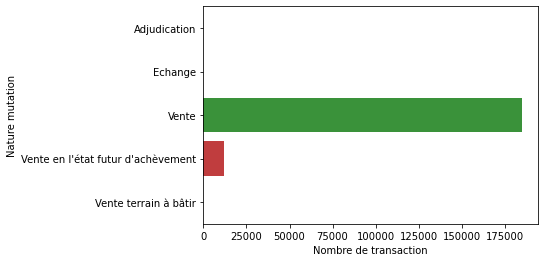

In [38]:
temp9 =vf2021.groupby(by="Nature mutation",as_index = False).count()
temp9["Nombre de transaction"]=temp9["Valeur fonciere"]
temp9.head(5)
sns.barplot(x="Nombre de transaction", y="Nature mutation", data=temp9);

### Import et Nettoyage des données - 2019

In [39]:
#url = r"https://www.data.gouv.fr/fr/datasets/r/90a98de0-f562-4328-aa16-fe0dd1dca60f" 2020

url = r"https://www.data.gouv.fr/fr/datasets/r/3004168d-bec4-44d9-a781-ef16f41856a2" #2019
vf2019 = pd.read_csv(url,
                     sep="|",header=0, low_memory = False)

In [40]:
del vf2019["Code service CH"]
del vf2019["Reference document"]
del vf2019["1 Articles CGI"]
del vf2019["2 Articles CGI"]
del vf2019["3 Articles CGI"]
del vf2019["4 Articles CGI"]
del vf2019["5 Articles CGI"]
del vf2019["No disposition"]
del vf2019["No voie"]
del vf2019["B/T/Q"]
del vf2019["Code voie"]
del vf2019["Code postal"]
del vf2019["Code commune"]
del vf2019["Prefixe de section"]
del vf2019["Section"]
del vf2019["No plan"]
del vf2019["Code type local"]
del vf2019["Identifiant local"]
del vf2019["No Volume"]

del vf2019["1er lot"]
del vf2019["2eme lot"]
del vf2019["3eme lot"]
del vf2019["4eme lot"]
del vf2019["5eme lot"]
del vf2019["Surface Carrez du 2eme lot"]
del vf2019["Surface Carrez du 3eme lot"]
del vf2019["Surface Carrez du 4eme lot"]
del vf2019["Surface Carrez du 5eme lot"]
vf2019['Date mutation']= pd.to_datetime(vf2019['Date mutation']) 
vf2019 = vf2019[vf2019["Nombre de lots"]<=1]


In [41]:
vf2019.dropna(axis="rows", subset=["Valeur fonciere","Code departement","Surface Carrez du 1er lot"],how='any',inplace = True)


In [42]:
fct = lambda x: float(x.replace(",","."))
vf2019["Valeur fonciere"] = vf2019["Valeur fonciere"].apply(fct)

fct2 = lambda x: x.replace(",",".")
vf2019["Surface Carrez du 1er lot"] = vf2019["Surface Carrez du 1er lot"].apply(fct2)
vf2019["Surface Carrez du 1er lot"] = vf2019["Surface Carrez du 1er lot"].apply(float)

In [43]:
vf2019["Prix au m2"]=vf2019["Valeur fonciere"]/vf2019["Surface Carrez du 1er lot"]

### Comparaison des données - 2019/2021

Ayant comparé rapidement les données entre 2021 et 2020, les courbes de la valeur foncière étaient assez identiques. Cependant entre 2021 et 2019, l'écart entre les valeurs moyennes pour chaque date est bien plus important et peut directement s'expliquer par la crise COVID.

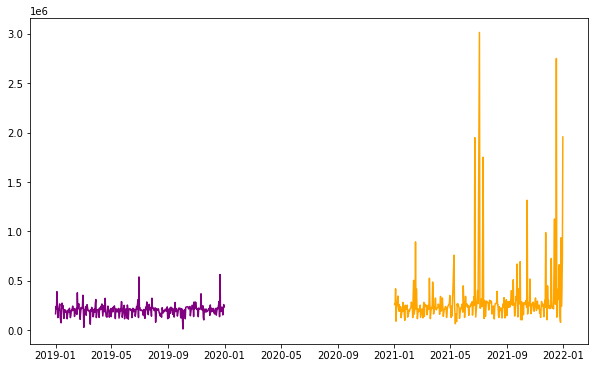

In [44]:
comp11=vf2019[vf2019["Valeur fonciere"]<4000000].groupby(by='Date mutation',sort='Date mutation',as_index=False).mean()
comp12=vf2021.groupby(by='Date mutation',sort='Date mutation',as_index=False).mean()
plt.figure(figsize=(10,6))
plt.plot(comp11["Date mutation"],comp11["Valeur fonciere"],"purple");
plt.plot(comp12["Date mutation"],comp12["Valeur fonciere"],"orange");

En superposant les deux graphs, nous voyons que l'allure générale de 2019 est bien en dessous de celle de 2021. Cela peut être dû à la vente de plus gros biens mais aussi à une augmentation générale des prix.

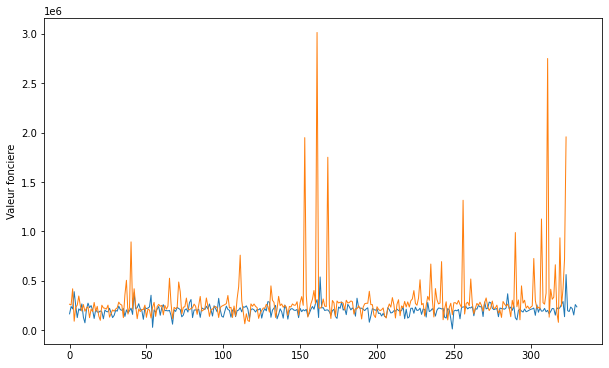

In [45]:
plt.figure(figsize=(10,6))
sns.lineplot(data=comp11["Valeur fonciere"], palette="tab10", linewidth=1);
sns.lineplot(data=comp12["Valeur fonciere"], palette="flare", linewidth=1);

In [46]:
comp21 = vf2019
comp21 = comp21.groupby(comp21["Date mutation"].dt.month).mean()
del comp21["Valeur fonciere"]
del comp21["Prix au m2"]
del comp21["Surface terrain"]
del comp21["Nombre de lots"]
del comp21["Nombre pieces principales"]
comp22 = vf2021
comp22 = comp22.groupby(comp22["Date mutation"].dt.month).mean()
del comp22["Valeur fonciere"]
del comp22["Prix au m2"]
del comp22["Surface terrain"]
del comp22["Nombre de lots"]
del comp22["Nombre pieces principales"]

Comparons maintenant quelques autres variables. En couleurs chaudes nous avons les données de 2021 et en couleurs froides celles de 2019. Nous observons que la surface carrez moyenne du 1er lot semble assez similaire jusqu'au mois d'octobre. Les courbes représentant les surfaces réelles baties sont quant-à elles décalées, celle de 2021 étant plus basse que celle de 2019. Les surfaces réelles baties ont donc été moins grandes en 2021 qu'en 2019. Les surfaces n'ont cependant pas particulièrement augmenté, ce n'est donc pas la raison de l'augmentation perçue dans les graphs précédents.

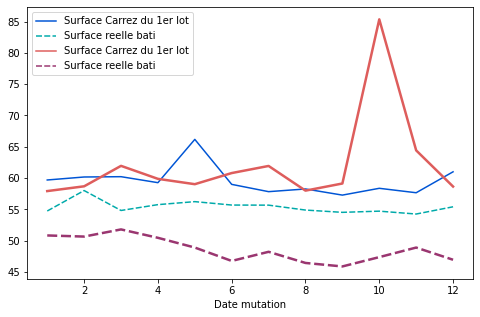

In [47]:
plt.figure(figsize=(8, 5))
sns.lineplot(data=comp21, palette="winter", linewidth=1.5);
sns.lineplot(data=comp22, palette="flare", linewidth=2.5);

Si nous superposons les variations mensuelles du prix au m2 moyen, nous arrivons à des courbes de variations quasi identiques. Nous en déduisons que la variation du prix au m2 suit un patern assez logique (plus de ventes l'été donc baisse des prix due à la demande plus forte, cf : https://www.immobilier-danger.com/A-quelle-periode-de-l-annee-faut-720.html ). Cependant, bien que les variations se répètent, les valeurs changent et en 2021 les prix moyens au m2 ont augmenté de plusieurs centaines d'euros comparé à 2019.

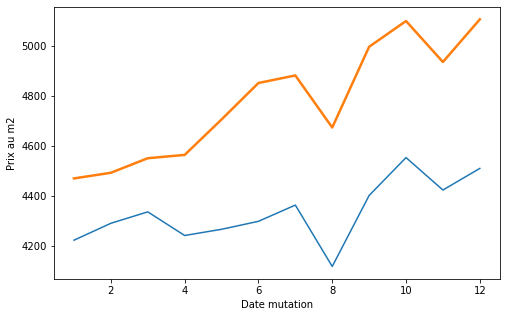

In [48]:
plt.figure(figsize=(8, 5))
comp31 = vf2019[vf2019["Prix au m2"]<40000]
comp31 = comp31.groupby(comp31["Date mutation"].dt.month).mean()
comp32 = vf2021[vf2021["Prix au m2"]<40000]
comp32 = comp32.groupby(comp32["Date mutation"].dt.month).mean()

sns.lineplot(data=comp31["Prix au m2"], palette="winter", linewidth=1.5);
sns.lineplot(data=comp32["Prix au m2"], palette="flare", linewidth=2.5);

Si nous comparons le nombre de mutations selon leurs natures, on voit que le nombre de ventes en 2021 est proche de 200 000 tandis qu'il était plus proches de 175 000 en 2019. Cette observation associée à la précédente justifient partiellement l'augmentation de la valeur foncière moyenne perçue au début.

In [51]:
comp41 =vf2019.groupby(by="Nature mutation",as_index = False).count()
comp41["Nombre de transaction"]=comp41["Valeur fonciere"]
comp42 =vf2021.groupby(by="Nature mutation",as_index = False).count()
comp42["Nombre de transaction"]=comp42["Valeur fonciere"]
comp3=comp42.merge(comp41, how="inner",on="Nature mutation")

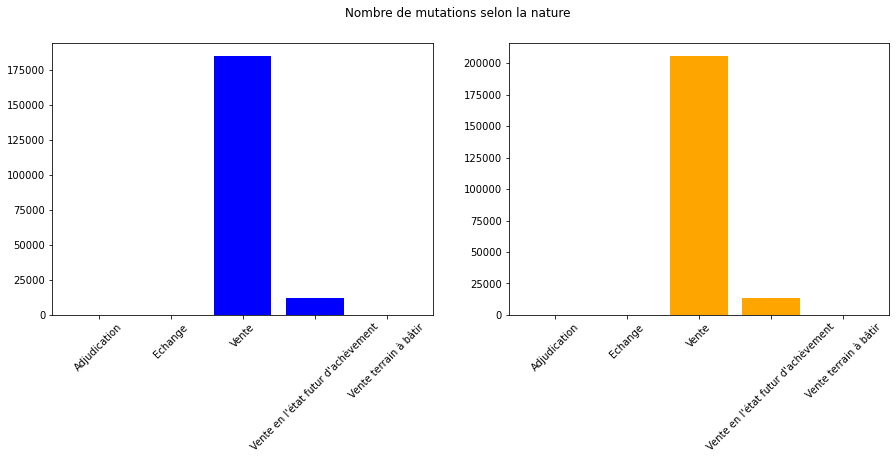

In [52]:
fig, axs = plt.subplots(1,2,figsize=(15,5))
fig.suptitle('Nombre de mutations selon la nature')
axs[0].tick_params(axis='x', rotation=45)
axs[1].tick_params(axis='x', rotation=45)
axs[0].bar(height="Date mutation_x", x="Nature mutation", data=comp3,color="blue");
axs[1].bar(height="Date mutation_y", x="Nature mutation", data=comp3,color="orange");

In [53]:
paris2 = vf2019[vf2019["Code departement"]=="75"]
paris2 = paris2.groupby(by="Commune",as_index=False).mean()
paris2["Commune"]=paris2["Commune"].apply(lambda x: int(x[-2:].lstrip("0")))
paris2=paris2.iloc[:,[0,1]]
paris1=paris.iloc[:,[0,1]]
parist = pd.DataFrame()
parist["Commune"]=paris1["Commune"]
parist["Diff fonciere"]=paris1["Valeur fonciere"]-paris2["Valeur fonciere"]
parist.head(1)

,Commune,Diff fonciere
0,1,424534.30487


Cette augmentation est partiellement visible sur la ville de Paris où la plupart des quartiers ont vu leur valeur foncière moyenne augmenter. Nous percevons ainsi des augmentations jusqu'à près d'un million d'euros pour le 8ème arrondissement.

In [54]:
#state_geo = "https://france-geojson.gregoiredavid.fr/repo/departements/75-paris/communes-75-paris.geojson" #ne convient pas pour nous
m = folium.Map(location=[48.86248747835313, 2.3383857736195335], zoom_start=12)

folium.Choropleth(
    geo_data=arrondissements,
    key_on = "feature.properties.c_ar",
    data=parist,
    columns=["Commune", "Diff fonciere"], #clef pour lier puis valeur à afficher
    fill_color = "YlOrRd"
).add_to(m)

folium.LayerControl().add_to(m)

m